# Import

In [1]:
import os
import sys
sys.path.append(os.path.abspath('..'))

import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

from grace.visuomotor import PeopleAttention

# Initialization 

In [2]:
root_folder = os.path.join(os.getcwd(),'dataset')

target_list = [-26, -13, 0, 13, 26]

data_dict = {
    "subject": [],
    "target": [],
    "eye": [],
    "pan_cmd": [],
    "tilt_cmd": [],
    "img_path": [],
    "csv_path": []
}

# Data Filtering

In [3]:
# Function to load image array from file path using OpenCV
def load_image(image_path):
    image = cv2.imread(image_path)
    # Perform any image processing if needed
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    return image

# Loading from files
for folder_name in os.listdir(root_folder):
    folder_path = os.path.join(root_folder, folder_name)
    if os.path.isdir(folder_path):
        for i, filename in enumerate(sorted(os.listdir(folder_path))):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                data_dict['subject'].append(eval(folder_name[14:]))
                data_dict['target'].append(target_list[i//2])
                if 'left' in filename:
                    data_dict['eye'].append('left')
                elif 'right' in filename:
                    data_dict['eye'].append('right')
                img_path = os.path.join(folder_path, filename)
                data_dict['img_path'].append(img_path)
            
            if filename.endswith(".csv"):
                csv_path = os.path.join(folder_path, filename)
                for i in range(2*len(target_list)):
                    data_dict['csv_path'].append(csv_path)
                temp_pd = pd.read_csv(csv_path)
                for j in range(len(temp_pd)):
                    temp = temp_pd.iloc[j]
                    if 'Left' in temp['Motor']:
                        data_dict["pan_cmd"].append(temp['Value (Deg)'])
                    elif 'Right' in temp['Motor']:
                        data_dict["pan_cmd"].append(temp['Value (Deg)'])
                    if 'UpDown' in temp['Motor']:
                        data_dict["tilt_cmd"].append(temp['Value (Deg)'])
                        data_dict["tilt_cmd"].append(temp['Value (Deg)'])


In [4]:
# Convert to DataFrames
df = pd.DataFrame(data_dict)
df['img'] = df['img_path'].apply(load_image)
df.head()

,subject,target,eye,pan_cmd,tilt_cmd,img_path,csv_path,img
0,0,-26,left,-11,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[21, 20, 15], [21, 20, 15], [22, 21, 16], [2..."
1,0,-26,right,-14,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[11, 12, 6], [11, 12, 6], [12, 11, 6], [12, ..."
2,0,-13,left,-2,-10,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[35, 34, 30], [34, 33, 29], [34, 33, 29], [3..."
3,0,-13,right,-7,-10,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[41, 37, 28], [44, 38, 30], [48, 42, 34], [5..."
4,0,0,left,3,-15,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[129, 112, 131], [129, 112, 131], [131, 114,..."


In [ ]:
# Check Images
for i in range(len(df)):
    img = df.loc[i,'img']
    plt.imshow(img)
    plt.show()

# Face Detection

In [5]:
# Face Detection
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(os.path.join(os.getcwd(),'pretrained','shape_predictor_68_face_landmarks.dat'))
dlib.cuda.set_device(0)

In [6]:
# Getting Target Pixels
pixel_list = []
disp_img_list = []
for i in range(len(df)):
    img = df.loc[i,'img']
    l_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    detections = detector(l_gray, 0)
    if len(detections)>0:
        detection = detections[0]
        landmarks = predictor(img, detection)
        x_target = round((landmarks.part(40).x + landmarks.part(43).x)/2)
        y_target = round((landmarks.part(40).y + landmarks.part(43).y)/2)
        pixel_list.append((x_target, y_target))
        disp_img = cv2.rectangle(img, (detection.left(), detection.top()), (detection.right(), detection.bottom()), (0, 0, 255), 2)
        disp_img = cv2.drawMarker(disp_img, (x_target,y_target), color=(255, 0, 0), markerType=cv2.MARKER_TILTED_CROSS, markerSize=13, thickness=2)
        disp_img_list.append(disp_img)
    else:
        pixel_list.append((None, None))
        disp_img_list.append(img)
df['target_pixel'] = pixel_list
df['disp_img']= disp_img_list

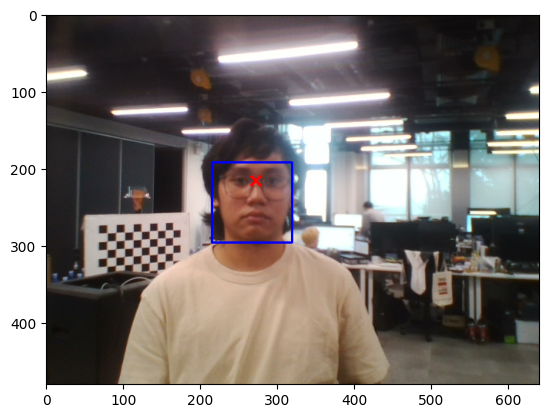

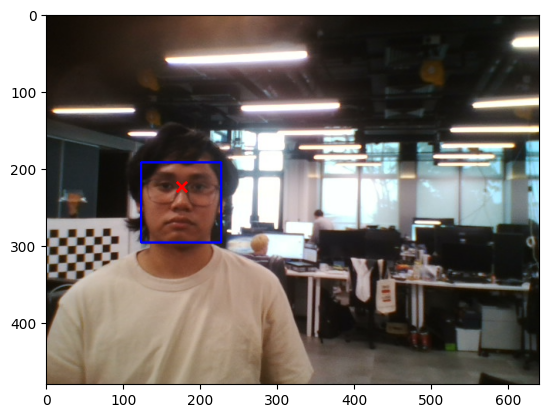

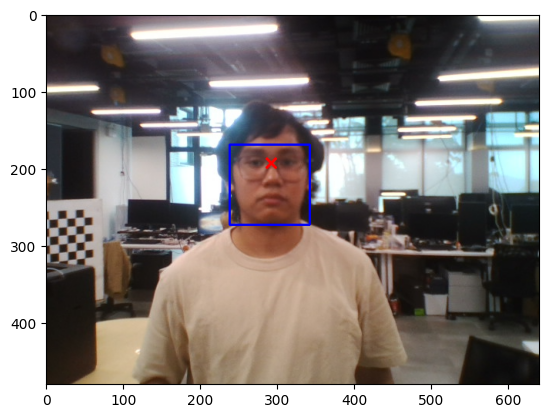

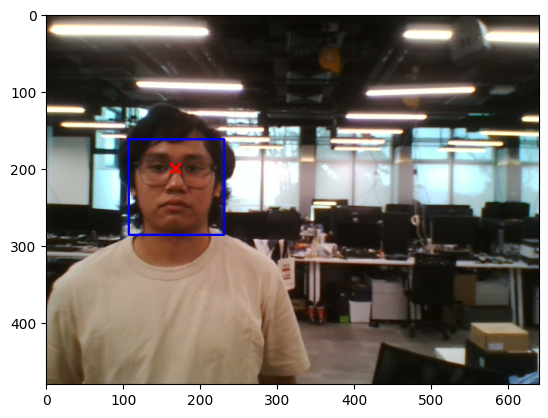

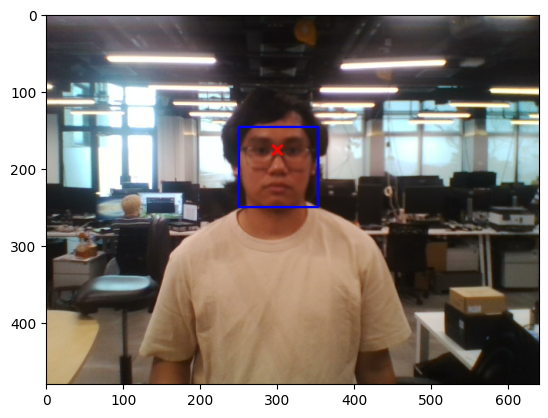

...

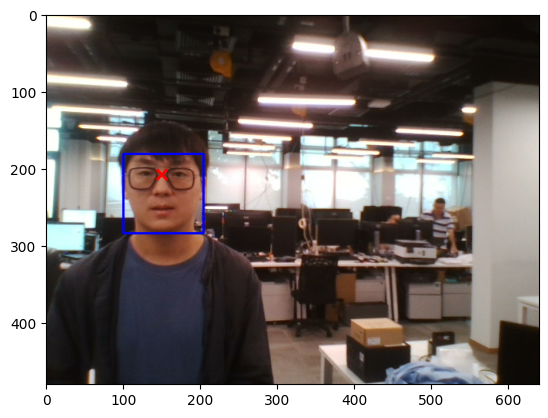

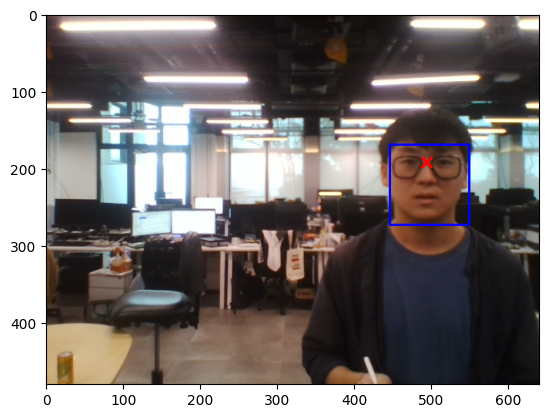

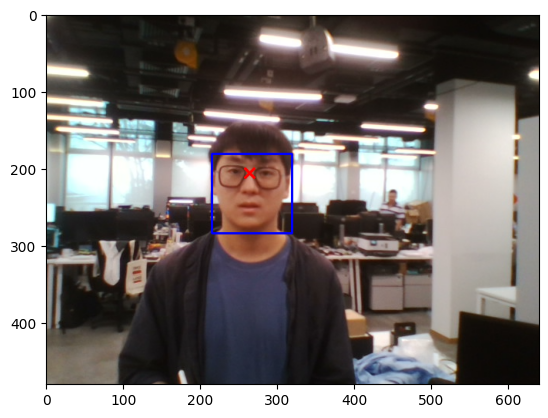

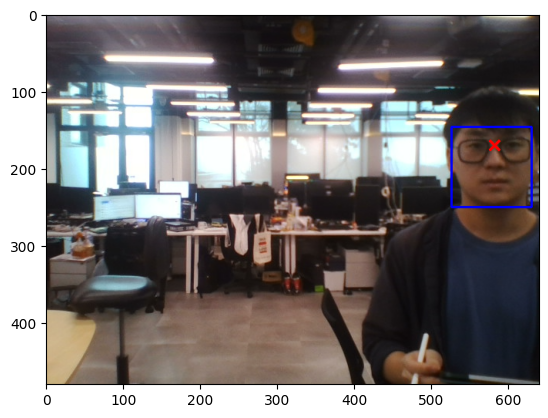

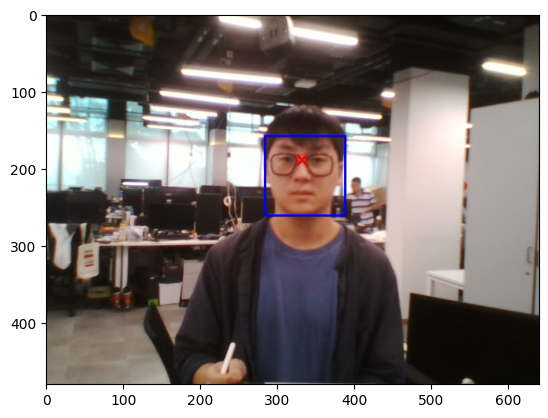

In [7]:
# Check Images
for i in range(len(df)):
    img = df.loc[i,'disp_img']
    plt.imshow(img)
    plt.show()

# DataFrame

In [45]:
df

,subject,target,eye,pan_cmd,tilt_cmd,img_path,csv_path,img,target_pixel,disp_img
0,0,-26,left,-11,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[21, 20, 15], [21, 20, 15], [22, 21, 16], [2...","(272, 216)","[[[21, 20, 15], [21, 20, 15], [22, 21, 16], [2..."
1,0,-26,right,-14,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[11, 12, 6], [11, 12, 6], [12, 11, 6], [12, ...","(176, 224)","[[[11, 12, 6], [11, 12, 6], [12, 11, 6], [12, ..."
2,0,-13,left,-2,-10,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[35, 34, 30], [34, 33, 29], [34, 33, 29], [3...","(292, 193)","[[[35, 34, 30], [34, 33, 29], [34, 33, 29], [3..."
3,0,-13,right,-7,-10,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[41, 37, 28], [44, 38, 30], [48, 42, 34], [5...","(168, 200)","[[[41, 37, 28], [44, 38, 30], [48, 42, 34], [5..."
4,0,0,left,3,-15,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[129, 112, 131], [129, 112, 131], [131, 114,...","(300, 176)","[[[129, 112, 131], [129, 112, 131], [131, 114,..."
5,0,0,right,-1,-15,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[92, 85, 66], [90, 83, 64], [90, 83, 64], [9...","(211, 186)","[[[92, 85, 66], [90, 83, 64], [90, 83, 64], [9..."
6,0,13,left,5,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[128, 104, 102], [126, 102, 100], [124, 100,...","(404, 212)","[[[128, 104, 102], [126, 102, 100], [124, 100,..."
7,0,13,right,3,-5,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[62, 53, 46], [65, 56, 50], [65, 57, 53], [6...","(266, 226)","[[[62, 53, 46], [65, 56, 50], [65, 57, 53], [6..."
8,0,26,left,11,-13,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[97, 99, 112], [97, 99, 112], [98, 100, 113]...","(451, 181)","[[[97, 99, 112], [97, 99, 112], [98, 100, 113]..."
9,0,26,right,9,-13,/home/jaynieles/dev/grace_robot/dataset/231107...,/home/jaynieles/dev/grace_robot/dataset/231107...,"[[[29, 26, 21], [27, 24, 19], [26, 23, 18], [2...","(299, 196)","[[[29, 26, 21], [27, 24, 19], [26, 23, 18], [2..."


# Analysis

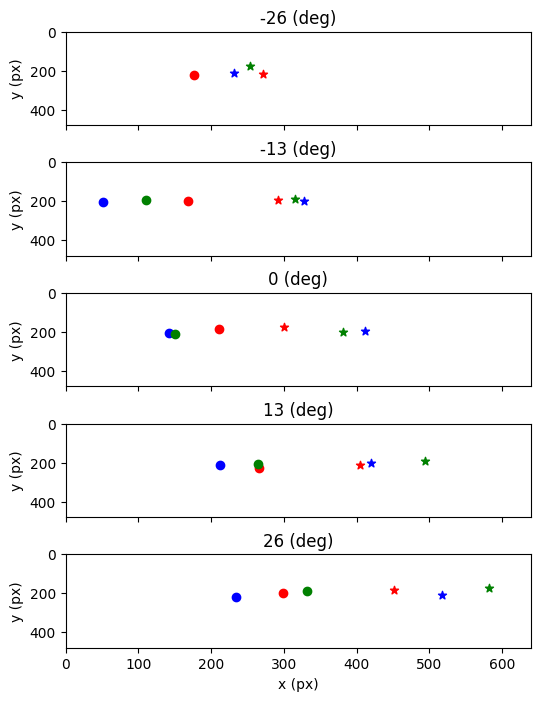

In [44]:
target_list = [-26, -13, 0, 13, 26]
color_list = ['red', 'blue', 'green']
marker_list = ['*', 'o']
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(6, 8), sharex='col', sharey='row')

for i in range(len(target_list)):
    filtered_df = df[df['target']==target_list[i]]
    target_pixel_list = filtered_df['target_pixel'].tolist()
    for j, (x, y) in enumerate(target_pixel_list):
        axs[i].scatter(x,y, color=color_list[j//2], marker=marker_list[j%2])
        axs[i].set_xlim([0, 639])
        axs[i].set_ylim([479,0])
        axs[i].set_ylabel('y (px)')
        axs[i].set_title(str(target_list[i]) + " (deg)" )

axs[-1].set_xlabel('x (px)')
fig.subplots_adjust(hspace=0.4, wspace=1)
plt.show()